### Dog Breed Classification in Pytorch

In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision
import torchvision.datasets as dset
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torchvision.transforms import ToTensor, ToPILImage
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import pandas
import lmdb
from sklearn.model_selection import train_test_split

np.random.seed(2)

In [2]:
# my_list = os.listdir("/home/pinkmonkey/Documents/Dogs_Breeds/Images")
my_list

In [18]:
import shutil

# # Creating Train / Val / Test folders (One time use)
dataroot = "/home/pinkmonkey/Documents/Dogs_Breeds/Images"
os.makedirs("/home/pinkmonkey/Documents/Dogs_Breeds/Dogs_split")
root_dir = "/home/pinkmonkey/Documents/Dogs_Breeds/Dogs_split"
classes_dir = os.listdir(dataroot)

test_ratio = 0.2

for cls in classes_dir:
    os.makedirs(root_dir +'/train/' + cls)
    os.makedirs(root_dir +'/test/' + cls)


    # Creating partitions of the data after shuffeling
    src = dataroot + "/" + cls # Folder to copy images from

    allFileNames = os.listdir(src)
    np.random.shuffle(allFileNames)
    train_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                              [int(len(allFileNames)* (1 - test_ratio))])


    train_FileNames = [src+'/'+ name for name in train_FileNames.tolist()]
    test_FileNames = [src+'/' + name for name in test_FileNames.tolist()]

    print('Total images: ', len(allFileNames))
    print('Training: ', len(train_FileNames))
    print('Testing: ', len(test_FileNames))

    # Copy-pasting images
    for name in train_FileNames:
        shutil.copy(name, root_dir +'/train/' + cls)

    for name in test_FileNames:
        shutil.copy(name, root_dir +'/test/' + cls)

Total images:  151
Training:  120
Testing:  31
Total images:  187
Training:  149
Testing:  38
Total images:  168
Training:  134
Testing:  34
Total images:  164
Training:  131
Testing:  33
Total images:  182
Training:  145
Testing:  37
Total images:  150
Training:  120
Testing:  30
Total images:  202
Training:  161
Testing:  41
Total images:  152
Training:  121
Testing:  31
Total images:  149
Training:  119
Testing:  30
Total images:  152
Training:  121
Testing:  31
Total images:  159
Training:  127
Testing:  32
Total images:  150
Training:  120
Testing:  30
Total images:  151
Training:  120
Testing:  31
Total images:  152
Training:  121
Testing:  31
Total images:  219
Training:  175
Testing:  44
Total images:  158
Training:  126
Testing:  32
Total images:  197
Training:  157
Testing:  40
Total images:  157
Training:  125
Testing:  32
Total images:  218
Training:  174
Testing:  44
Total images:  185
Training:  148
Testing:  37
Total images:  195
Training:  156
Testing:  39
Total images:

In [4]:
cd "/home/pinkmonkey/Documents/Dogs_Breeds_Data/Dogs_split"

/home/pinkmonkey/Documents/Dogs_Breeds_Data/Dogs_split


In [26]:
dataroot = "/home/pinkmonkey/Documents/Dogs_Breeds_Data/Dogs_split"
# Number of workers for dataloader
workers = 1

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 20

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [27]:
# os.path.isdir(dataroot)

In [28]:
# os.listdir(dataroot)

In [29]:
# # We can use an image folder dataset the way we have it setup.
# # Create the dataset

# dataset = dset.ImageFolder(root=dataroot,
#                            transform=transforms.Compose([
#                                transforms.Resize(image_size),
#                                transforms.CenterCrop(image_size),
#                                transforms.ToTensor(),
#                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
#                            ]))

# train_set, val_set = torch.utils.data.random_split(dataset, [16464, 4116])

# #data_set['train'], data_set['val'] = torch.utils.data.random_split(dataset, [16464, 4116])

# # Create the dataloader
# trainloader = torch.utils.data.DataLoader(train_set, batch_size=batch_size,
#                                          shuffle=True, num_workers=1)

# # Create the dataloader
# testloader = torch.utils.data.DataLoader(val_set, batch_size=batch_size,
#                                          shuffle=True, num_workers=1)

In [30]:
# print(dataset.samples[-1])
# print(dataset.classes[-1])
# dataset.class_to_idx
# print(dataset.targets[-1])

In [38]:
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'test': transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

data_dir = dataroot
image_datasets = {x: dset.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'test']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'test']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'test']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [44]:
# torch.cuda.is_available()

In [40]:
# def load_data(dataroot, batch_size, train):
#     transform = {
#         'train': transforms.Compose(
#             [   transforms.ToTensor(),
#                 transforms.Resize(image_size),
#                 transforms.Normalize(mean=[0.5, 0.5, 0.5],
#                                   std=[0.5, 0.5, 0.5])]),
#         'test': transforms.Compose(
#             [   transforms.ToTensor(),
#                 transforms.Resize(image_size),
#                 transforms.Normalize(mean=[0.5, 0.5, 0.5],
#                                   std=[0.5, 0.5, 0.5])])
#         }
#     data = dset.ImageFolder(root = dataroot, transform=transform['train' if train else 'test'])
#     data_loader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=True, drop_last = True if train else False)
#     return data_loader 

In [42]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

RuntimeError: Caught RuntimeError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/home/pinkmonkey/anaconda3/lib/python3.7/site-packages/torch/utils/data/_utils/worker.py", line 178, in _worker_loop
    data = fetcher.fetch(index)
  File "/home/pinkmonkey/anaconda3/lib/python3.7/site-packages/torch/utils/data/_utils/fetch.py", line 47, in fetch
    return self.collate_fn(data)
  File "/home/pinkmonkey/anaconda3/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py", line 79, in default_collate
    return [default_collate(samples) for samples in transposed]
  File "/home/pinkmonkey/anaconda3/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py", line 79, in <listcomp>
    return [default_collate(samples) for samples in transposed]
  File "/home/pinkmonkey/anaconda3/lib/python3.7/site-packages/torch/utils/data/_utils/collate.py", line 55, in default_collate
    return torch.stack(batch, 0, out=out)
RuntimeError: stack expects each tensor to be equal size, but got [3, 64, 64] at entry 0 and [3, 74, 64] at entry 1


In [35]:
import matplotlib.pyplot as plt
import numpy as np

# functions to show an image


def imshow(img):
    plt.figure(figsize=(15,15))
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(dataloader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

TypeError: img should be PIL Image. Got <class 'torch.Tensor'>

In [85]:
# import torch.nn as nn
# import torch.nn.functional as F


# class Net(nn.Module):
#     def __init__(self):
#         super(Net, self).__init__()
#         self.conv1 = nn.Conv2d(3, 6, 5)
#         self.pool = nn.MaxPool2d(2, 2)
#         self.conv2 = nn.Conv2d(6, 16, 5)
#         self.fc1 = nn.Linear(16 * 5 * 5, 120)
#         self.fc2 = nn.Linear(120, 84)
#         self.fc3 = nn.Linear(84, 10)

#     def forward(self, x):
#         x = self.pool(F.relu(self.conv1(x)))
#         x = self.pool(F.relu(self.conv2(x)))
#         x = x.view(-1, 16 * 5 * 5)
#         x = F.relu(self.fc1(x))
#         x = F.relu(self.fc2(x))
#         x = self.fc3(x)
#         return x


# net = Net()

In [40]:
device

device(type='cuda', index=0)

In [23]:
import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 32, 5)
        self.fc1 = nn.Linear(32 * 13 * 13, 120)
        self.fc2 = nn.Linear(120, 120)
        self.fc3 = nn.Linear(120, 120)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 32 * 13 * 13)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


net = Net()
net = net.to(device)

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=num_epochs):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs_t, labels_t in trainloaders:
                inputs_t = inputs_t.to(device)
                labels_t = labels_t.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs_t)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels_t)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels_t.data)
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [19]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

In [25]:
for epoch in range(num_epochs):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 50 == 49:    # print every 50 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 50))
            running_loss = 0.0

print('Finished Training')

[1,    50] loss: 4.790
[1,   100] loss: 4.789
[1,   150] loss: 4.789
[1,   200] loss: 4.789
[1,   250] loss: 4.788
[2,    50] loss: 4.791
[2,   100] loss: 4.788
[2,   150] loss: 4.788
[2,   200] loss: 4.787
[2,   250] loss: 4.790
[3,    50] loss: 4.788
[3,   100] loss: 4.791
[3,   150] loss: 4.790
[3,   200] loss: 4.787
[3,   250] loss: 4.787
[4,    50] loss: 4.788
[4,   100] loss: 4.788
[4,   150] loss: 4.789
[4,   200] loss: 4.790
[4,   250] loss: 4.789
[5,    50] loss: 4.788
[5,   100] loss: 4.788
[5,   150] loss: 4.789
[5,   200] loss: 4.790
[5,   250] loss: 4.790
[6,    50] loss: 4.788
[6,   100] loss: 4.791


KeyboardInterrupt: 

In [20]:
labels.shape

torch.Size([16])

In [21]:
inputs.shape

torch.Size([16, 3, 64, 64])

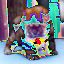

In [61]:
a = 11
t = inputs[a]
im = ToPILImage()(inputs[a])
im

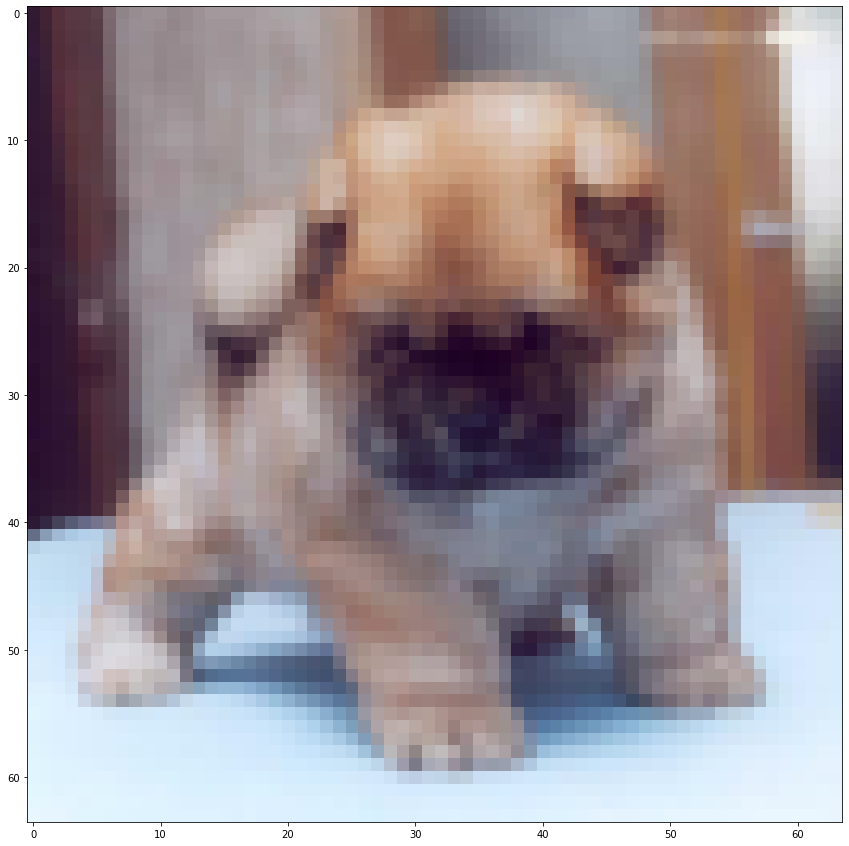

In [62]:
plt.figure(figsize=(15,15))
imshow(t)

In [ ]:
# questions need to be asked:
#                    _, preds = torch.max(outputs, 1)
#                     if phase == 'train':
#                         loss.backward()
#                         optimizer.step()



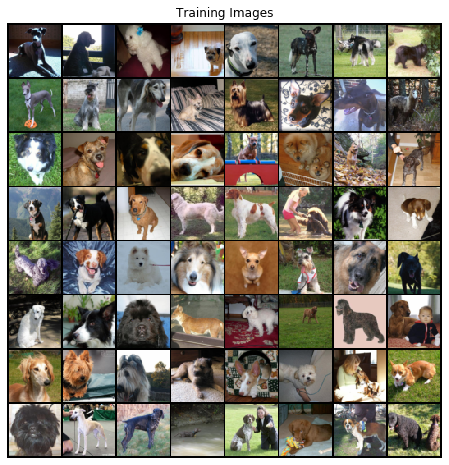

In [102]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=1)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [103]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [104]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [105]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [106]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [107]:
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [108]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [109]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/20][0/322]	Loss_D: 1.5208	Loss_G: 5.3577	D(x): 0.4649	D(G(z)): 0.3858 / 0.0061
[0/20][50/322]	Loss_D: 0.1322	Loss_G: 13.5681	D(x): 0.8995	D(G(z)): 0.0000 / 0.0000
[0/20][100/322]	Loss_D: 0.2045	Loss_G: 7.3566	D(x): 0.9053	D(G(z)): 0.0687 / 0.0008
[0/20][150/322]	Loss_D: 0.4715	Loss_G: 3.0478	D(x): 0.8539	D(G(z)): 0.2241 / 0.0696
[0/20][200/322]	Loss_D: 1.1325	Loss_G: 1.5739	D(x): 0.5124	D(G(z)): 0.2071 / 0.2353
[0/20][250/322]	Loss_D: 0.4547	Loss_G: 2.9168	D(x): 0.7696	D(G(z)): 0.0139 / 0.1177
[0/20][300/322]	Loss_D: 0.4861	Loss_G: 5.7694	D(x): 0.8045	D(G(z)): 0.1538 / 0.0060
[1/20][0/322]	Loss_D: 0.3820	Loss_G: 6.2284	D(x): 0.9861	D(G(z)): 0.2490 / 0.0031
[1/20][50/322]	Loss_D: 0.4792	Loss_G: 5.8474	D(x): 0.8806	D(G(z)): 0.2416 / 0.0036
[1/20][100/322]	Loss_D: 1.0037	Loss_G: 4.2235	D(x): 0.6801	D(G(z)): 0.3028 / 0.0308
[1/20][150/322]	Loss_D: 0.4900	Loss_G: 3.4474	D(x): 0.7219	D(G(z)): 0.0609 / 0.0461
[1/20][200/322]	Loss_D: 0.6577	Loss_G: 8.6437	D(x): 0.9

[14/20][0/322]	Loss_D: 0.4953	Loss_G: 3.9119	D(x): 0.8848	D(G(z)): 0.2787 / 0.0263
[14/20][50/322]	Loss_D: 0.6288	Loss_G: 4.2946	D(x): 0.8846	D(G(z)): 0.3490 / 0.0195
[14/20][100/322]	Loss_D: 0.6908	Loss_G: 1.9644	D(x): 0.6101	D(G(z)): 0.1088 / 0.1959
[14/20][150/322]	Loss_D: 0.4895	Loss_G: 2.8871	D(x): 0.7684	D(G(z)): 0.1499 / 0.0742
[14/20][200/322]	Loss_D: 0.4069	Loss_G: 3.8189	D(x): 0.8619	D(G(z)): 0.1992 / 0.0307
[14/20][250/322]	Loss_D: 0.4792	Loss_G: 3.9462	D(x): 0.8934	D(G(z)): 0.2753 / 0.0268
[14/20][300/322]	Loss_D: 3.1636	Loss_G: 5.0562	D(x): 0.9664	D(G(z)): 0.9114 / 0.0194
[15/20][0/322]	Loss_D: 0.4253	Loss_G: 2.9135	D(x): 0.8135	D(G(z)): 0.1678 / 0.0756
[15/20][50/322]	Loss_D: 0.4711	Loss_G: 3.5065	D(x): 0.9712	D(G(z)): 0.3171 / 0.0449
[15/20][100/322]	Loss_D: 0.5689	Loss_G: 1.7585	D(x): 0.6690	D(G(z)): 0.0928 / 0.2264
[15/20][150/322]	Loss_D: 0.6590	Loss_G: 1.7534	D(x): 0.6666	D(G(z)): 0.1589 / 0.2137
[15/20][200/322]	Loss_D: 0.2125	Loss_G: 3.6619	D(x): 0.8857	D(G(z)): 0.

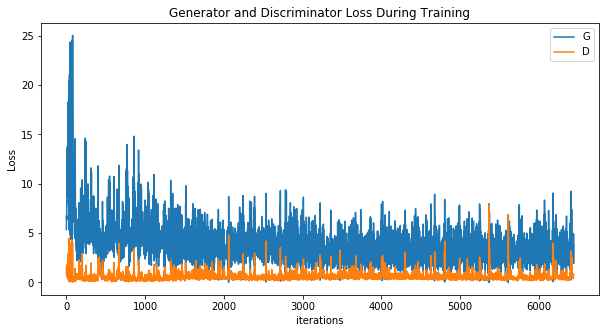

In [110]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

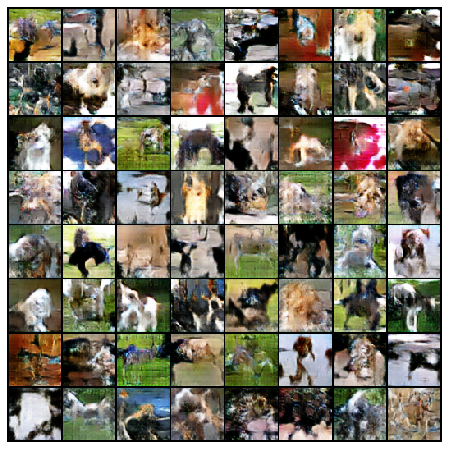

In [111]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

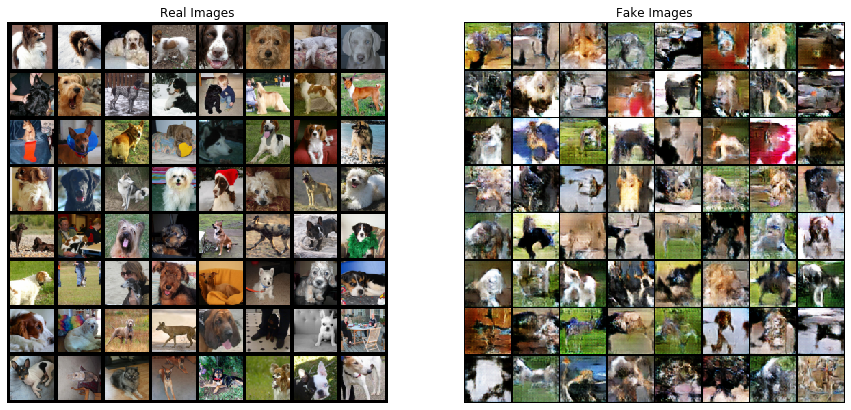

In [112]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [113]:
torch.cuda.is_available()

True

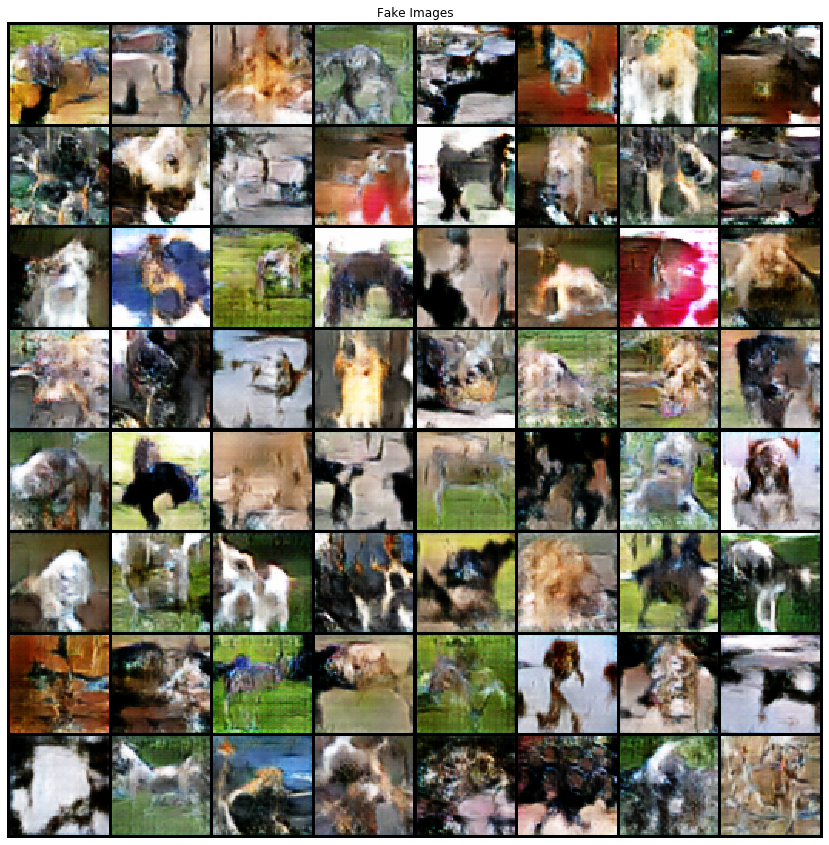

In [114]:
# Plot the fake images from the last epoch
plt.figure(figsize=(15,15))
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [15]:
# import tarfile
# tar = tarfile.open("images.tar","r")
# tar.extractall('/home/pinkmonkey/Documents/Dogs_Breeds')

In [16]:
# tarl = tarfile.open("lists.tar","r")
# tarl.extractall('/home/pinkmonkey/Documents/Dogs_Breeds')

In [224]:
l = open("file_list.mat", "r")

In [5]:
import io
with open('file_list.mat', 'rb') as f2:
    mat = f2.read()
    #mat = pickle.load(f2, encoding="latin-1")
    print(mat)
#     wrapper = io.TextIOWrapper(f2, encoding='utf-8', write_through=True)
#     print(wrapper.read())
#     f2.close()

b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sun Oct  9 08:29:09 2011                                                \x00\x01IM\x0f\x00\x00\x00\x98\xb3\x01\x00x\x9c\xb4\x98\xcfJ\x031\x10\xc6WP\xd1K\xf1\r<\xb5\x9e\xd4\xcc\x9f\xcc$g_\xc0\xa37\x11\xfc\xd3J\x11A}b_\xc4\xd4\xae"=m\x06\xbf\xa5\xa1\xec\xb2\xf91|\x99\xf9&\xd9\xd90\x0c7\x9f\xa7\xc3a\xfb?jco\xd8^\x07\xe3\xfd\xfd\xf5\xf6\xd9f\x1c\xb7\xf1\xb8Z?\xdc\xaeWo\xef\xe3{\xb3\xcd\xfc6~\xe6\xef\xef\xcc\xdf\xcc;\xfb\xc3=\x19\xef_\x12\xa7\x92\x8d\xd3\xf9\xd5r\xb5\xfc\xb8k\xbf\xcb\xdfg\xb7\x94\x92\xeb\xc5\xf3\xeb\x13\x8cOBP\xbe\xf1t\xfeb\x87\xbf\x98\xc0w\xf9\xc6\xc3\xe2\xafnH}\x884A\xf9,\x05\xcb\xcfX\xbe\x88C\xf9\xea\xd3\xf9\x81\xfc\xa4\xcc\xd0\xfc$\xab\xd8\xfc,\x84]\xdf\xaa\xd3\xf9\x01\xfd9e\xa8\xfe\xdc\x1c\x14\xa9\x0f\x8bL\xf7\xff\x88>\xd2\xa1O\x84\xef\x84\xd5\xdf;\xf23\x12\x7f-\xd0\xf8\x852\xb4?\nc\xf5\x17)\x02\x8d_\r\x1b\x7f5\xe8\xfeJyl\x00(\xbe\xd2t\xfd#\xfcL\xd3\xfbK`}5c\xfdGkG\xff\r\xf0s\x02\xf3s\x87\xffD\xf8V\xa1|#\xc7\xf29A\x

In [17]:
img_dir = "/home/pinkmonkey/Documents/Dogs_Breeds/Images"

In [33]:
cd "/home/pinkmonkey/Documents/Dogs_Breeds/Images/n02085620-Chihuahua"

/home/pinkmonkey/Documents/Dogs_Breeds/Images/n02085620-Chihuahua


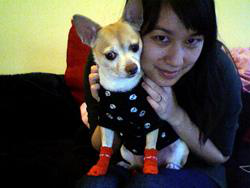

In [34]:
from PIL import Image
im = Image.open("n02085620_7.jpg")
im

In [52]:
from torchvision.transforms import ToTensor, ToPILImage
import numpy as np
tim = ToTensor()(im)
tim.shape

torch.Size([3, 188, 250])

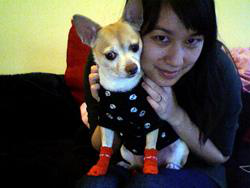

In [36]:
ToPILImage()(tim)

In [20]:
f = open('dogs', "rb")

In [21]:
import pickle

X = pickle.load(f, encoding="latin-1")

In [22]:
data, labels = X

In [23]:
data.shape

(20580, 128, 128, 3)

In [27]:
labels.shape

(20580, 120)

In [28]:
type(data)

numpy.ndarray

In [57]:
x_train, x_valid, y_train, y_valid = train_test_split(data, labels, test_size=0.20, random_state=123)

In [61]:
x_train[0].shape

(128, 128, 3)

In [63]:
x_train, y_train, x_valid, y_valid = map(
    torch.tensor, (x_train, y_train, x_valid, y_valid)
)

In [156]:
x_train.shape

torch.Size([16464, 128, 128, 3])

In [163]:
a = x_train[0].view(16384, 3)
a = torch.transpose(a, 0, 1)
a = a.view(3, 128, 128)
a.shape

torch.Size([3, 128, 128])

In [ ]:
n, c = x_train.shape
x_train, x_train.shape, y_train.min(), y_train.max()
print(x_train, y_train)
print(x_train.shape)
print(y_train.min(), y_train.max())

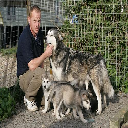

In [164]:
ToPILImage()(a)

In [202]:
x = torch.randn(2, 4, 3)
x

tensor([[[-0.3886,  1.3131,  0.0269],
         [ 0.0718,  1.4002, -0.4171],
         [ 0.4941,  0.3740, -1.4999],
         [-1.0730,  0.6493,  0.0508]],

        [[-0.3264, -0.9943,  1.5658],
         [ 1.7199, -0.8775,  0.5089],
         [ 1.2252, -0.7383,  1.0815],
         [ 0.5273,  0.4641, -0.6556]]])

In [219]:
#x = x.view(3, 4, 2)
xx = torch.transpose(x, 1, 2)
xx
#x.shape

tensor([[[-0.3886,  0.0718,  0.4941, -1.0730],
         [ 1.3131,  1.4002,  0.3740,  0.6493],
         [ 0.0269, -0.4171, -1.4999,  0.0508]],

        [[-0.3264,  1.7199,  1.2252,  0.5273],
         [-0.9943, -0.8775, -0.7383,  0.4641],
         [ 1.5658,  0.5089,  1.0815, -0.6556]]])

In [220]:
xx.shape

torch.Size([2, 3, 4])

In [192]:
a = data[11]
a = ToTensor()(a)

In [193]:
a

tensor([[[0.3216, 0.2941, 0.2392,  ..., 0.3451, 0.3725, 0.3686],
         [0.2941, 0.2902, 0.2392,  ..., 0.3569, 0.3843, 0.3725],
         [0.2980, 0.2902, 0.2157,  ..., 0.3137, 0.3333, 0.3333],
         ...,
         [0.3686, 0.3725, 0.3804,  ..., 0.2235, 0.2706, 0.3137],
         [0.4157, 0.3647, 0.3529,  ..., 0.2196, 0.2392, 0.2431],
         [0.2824, 0.3725, 0.3725,  ..., 0.1961, 0.2078, 0.2471]],

        [[0.5098, 0.5137, 0.4706,  ..., 0.5216, 0.5490, 0.5451],
         [0.4824, 0.5098, 0.4706,  ..., 0.5333, 0.5608, 0.5490],
         [0.4863, 0.5098, 0.4471,  ..., 0.4902, 0.5098, 0.5098],
         ...,
         [0.4431, 0.4392, 0.4353,  ..., 0.3725, 0.4196, 0.4627],
         [0.5020, 0.4392, 0.4196,  ..., 0.3686, 0.3882, 0.3922],
         [0.3686, 0.4588, 0.4392,  ..., 0.3529, 0.3647, 0.4000]],

        [[0.2667, 0.2745, 0.2588,  ..., 0.3922, 0.4196, 0.4157],
         [0.2392, 0.2706, 0.2588,  ..., 0.4039, 0.4314, 0.4196],
         [0.2431, 0.2706, 0.2353,  ..., 0.3608, 0.3804, 0.

In [198]:
a = torch.transpose(x_train[0], -3, 2)
a = torch.transpose(a, -2, 2)

In [199]:
a

tensor([[[0.4314, 0.2980, 0.2745,  ..., 0.1098, 0.6353, 0.1137],
         [0.2314, 0.2549, 0.2627,  ..., 0.3216, 0.5569, 0.2196],
         [0.3333, 0.2549, 0.1922,  ..., 0.3255, 0.3961, 0.2902],
         ...,
         [0.4157, 0.3020, 0.3647,  ..., 0.5137, 0.5333, 0.5176],
         [0.1647, 0.4275, 0.2824,  ..., 0.4431, 0.4314, 0.4902],
         [0.2235, 0.3059, 0.4980,  ..., 0.4196, 0.4039, 0.3765]],

        [[0.4392, 0.3059, 0.2824,  ..., 0.1725, 0.6824, 0.1137],
         [0.2392, 0.2627, 0.2706,  ..., 0.3725, 0.5961, 0.2392],
         [0.3412, 0.2627, 0.2000,  ..., 0.3569, 0.4118, 0.3412],
         ...,
         [0.4118, 0.3020, 0.3490,  ..., 0.4510, 0.4745, 0.4314],
         [0.1608, 0.4275, 0.2667,  ..., 0.3725, 0.3647, 0.4000],
         [0.2196, 0.3059, 0.4824,  ..., 0.3529, 0.3451, 0.3059]],

        [[0.4275, 0.2941, 0.2706,  ..., 0.0000, 0.5961, 0.0118],
         [0.2275, 0.2510, 0.2588,  ..., 0.2000, 0.5020, 0.1490],
         [0.3294, 0.2510, 0.1882,  ..., 0.2039, 0.3216, 0.

In [200]:
a.shape

torch.Size([3, 128, 128])

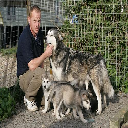

In [201]:
ToPILImage()(a)